# Import packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import datetime as dt
import plotly.graph_objects as go
import plotly.express as px


# Load the data 

In [2]:
df=pd.read_csv('/Users/yingyuxuan/Desktop/covid19-global-forecasting-week-5/data/covid_19_global_data.csv')
# yingyuxuan is my mom's name  ^.^ 

In [3]:
# shape of our data 
df.shape, len(df)

((858824, 9), 858824)

In [4]:
df.columns
# we can see there are 9 different columns in the train data 

Index(['Id', 'County', 'Province_State', 'Country_Region', 'Population',
       'Weight', 'Date', 'Target', 'TargetValue'],
      dtype='object')

In [5]:
# check first 5 rows we can see each day has two different records one for ConfirmedCases and one for Fatalities 
# and the Target Value shows the number of ConfirmedCases and Fatalities in one day .
df.head()

,Id,County,Province_State,Country_Region,Population,Weight,Date,Target,TargetValue
0,1,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-23,ConfirmedCases,0.0
1,2,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-23,Fatalities,0.0
2,3,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-24,ConfirmedCases,0.0
3,4,NaN,NaN,Afghanistan,27657145,0.583587,2020-01-24,Fatalities,0.0
4,5,NaN,NaN,Afghanistan,27657145,0.058359,2020-01-25,ConfirmedCases,0.0


In [6]:
# check last 5 rows
df.tail()

,Id,County,Province_State,Country_Region,Population,Weight,Date,Target,TargetValue
858819,969604,NaN,NaN,Zimbabwe,14240168,0.607106,2020-05-23,Fatalities,0.0
858820,969605,NaN,NaN,Zimbabwe,14240168,0.060711,2020-05-24,ConfirmedCases,0.0
858821,969606,NaN,NaN,Zimbabwe,14240168,0.607106,2020-05-24,Fatalities,0.0
858822,969607,NaN,NaN,Zimbabwe,14240168,0.060711,2020-05-25,ConfirmedCases,0.0
858823,969608,NaN,NaN,Zimbabwe,14240168,0.607106,2020-05-25,Fatalities,0.0


In [7]:
#describe of target value  we can see there are negative values 
df.TargetValue.describe()

count    858824.000000
mean         11.100251
std         276.910007
min      -10034.000000
25%           0.000000
50%           0.000000
75%           0.000000
max       36163.000000
Name: TargetValue, dtype: float64

In [8]:
# Check missing data 
df.isnull().sum()

Id                    0
County            79360
Province_State    46376
Country_Region        0
Population            0
Weight                0
Date                  0
Target                0
TargetValue           0
dtype: int64

In [9]:
# check the propotion of missing data  
print(round((79360/len(df))*100,5),"% of missing data in County column.")
print(round((46376/len(df))*100,5),"% of missing data in Province_State column")
# both of them less than 20%  so we can keep them 

9.24054 % of missing data in County column.
5.39994 % of missing data in Province_State column


In [10]:
df.Date =  pd.to_datetime(df['Date']) 

# EDA

In [11]:
# I will analyze ConfirmedCases and Fatalities seperately
df_c=df[df.Target=='ConfirmedCases']
df_f=df[df.Target=='Fatalities']

# Map ConfirmedCases and Fatalities cross different countries

In [12]:
# get 'Country_Region','TargetValue' columns 
map_df_c=pd.DataFrame(df_c[['Country_Region','TargetValue']].groupby('Country_Region')['TargetValue'].sum()).sort_values(by='TargetValue',ascending=False).reset_index()
# generate country code  based on country name 
import pycountry
CODE=[]
for country in map_df_c.Country_Region:
    try:
        code=pycountry.countries.get(name=country).alpha_3
        CODE.append(code)
    except:
        CODE.append(None)
CODE[:10]# check first 10 Country Code we can see some None there because some country names are not offical 

[None, 'BRA', None, 'GBR', 'ESP', 'ITA', 'FRA', 'DEU', 'CAN', 'CHN']

In [13]:
map_df_c['CODE']=CODE
map_df_c.head()

,Country_Region,TargetValue,CODE
0,US,4970430.0,None
1,Brazil,374898.0,BRA
2,Russia,353427.0,None
3,United Kingdom,262547.0,GBR
4,Spain,235400.0,ESP


In [14]:
# check how many country Codes are not found 
not_found_countries=[]
index=[]
for i in range(len(map_df_c)):
    if map_df_c.CODE[i] ==None:
        not_found_countries.append(map_df_c['Country_Region'][i])
        index.append(i)

In [15]:
# find corresponding CODE for the countries in not_found_countries
found_countries_CODE=['USA','RUS','IRN','KOR','MDA','BOL',"CIV",'COG','VEN','XK','Diamond Princess','TZA','COD'
                     ,'TWN','West Bank and Gaza','VNM','MM','BRN','SYR','LAO','VAT','MA']

In [26]:
#replace Nones with found Codes
for i in range(len(index)):
    map_df_c.CODE.iloc[index[i]]=found_countries_CODE[i]

In [17]:
import plotly.graph_objects as go

def map_plot(df,colorbar_title,title_text):
    fig = go.Figure(data=go.Choropleth(
        locations = df['CODE'],
        z = df['TargetValue'],
        text = df['Country_Region'],
        colorscale = 'Bluered_r',
        autocolorscale=False,
        reversescale=True,
        marker_line_color='darkgray',
        marker_line_width=0.5,
        colorbar_tickprefix = ' ',
        colorbar_title =colorbar_title,
    ))

    fig.update_layout(
        title_text=title_text,
        geo=dict(
            showframe=False,
            showcoastlines=False,
            projection_type='equirectangular'
        ),
        annotations = [dict(
            x=0.55,
            y=0.1,
            xref='paper',
            yref='paper',
            text=' ',
            showarrow = False
        )]
    )

    fig.show()
    

In [18]:
# World Confirmed Cases
map_plot(map_df_c,'Confirmed Cases','2020 Jan-May Confirmed Case Amount in Different Countries')

 <img src= 'images/world_map1.png'/>

In [409]:
# Group by country and obtianed total fatalities during those months
Fatalities=pd.DataFrame(df[['Country_Region','TargetValue']].groupby('Country_Region')['TargetValue'].sum()).sort_values(by='TargetValue',ascending=False).reset_index()
map_df_f=pd.merge(Fatalities,map_df_c[['Country_Region','CODE']],on='Country_Region')# obtained the CODE 
# World total Fatalities 
map_plot(map_df_f,'Fatalities','2020 Jan-May Total Fatalities in Different Countries')

 <img src= 'images/world_map2.png'/>

In [272]:
#  COVID-19 global tendency of confirmed cases map excluding USA   
map_plot(map_df_c[map_df_c.CODE!='USA'],'Confirmed Cases','2020 Jan-May Confirmed Case Amount in Different Countries')

 <img src= 'images/confirmedcases_world_map_without_usa.png'/>

In [273]:
#  COVID-19 global tendency of fertalities map excluding USA  
map_plot(map_df_f[map_df_f.CODE!='USA'].dropna(axis=0),'Confirmed Cases','2020 Jan-May Fatalities in Different Countries')

 <img src= 'images/fatality_world_map_without_usa.png'/>

In [410]:
# plot bubble world map 
fig = px.scatter_geo(map_df_c.dropna(axis=0), locations="CODE", color="CODE",
                     hover_name="Country_Region", size=map_df_c.TargetValue,
                     projection="natural earth")
fig.show()

 <img src= 'images/world_map.png'/>

#  COVID-19  in different continents

In [411]:
# get 'Country_Region','TargetValue' columns 
map_df_c=pd.DataFrame(df_c[['Date','Country_Region','TargetValue']].groupby(['Country_Region','Date'])['TargetValue'].sum()).reset_index()
map_df_f=pd.DataFrame(df_f[['Date','Country_Region','TargetValue']].groupby(['Country_Region','Date'])['TargetValue'].sum()).reset_index()
# generate country code  based on country name 
import pycountry
CODE=[]
for country in set(list(map_df_c.Country_Region)):
    try:
        code=pycountry.countries.get(name=country).alpha_2
        CODE.append([country,code])
    except:
        CODE.append(None)

In [412]:
# create new dataframe 
country_con=pd.DataFrame()
country_con['Country_code']=pd.Series(CODE).dropna(axis=0)
country_con['Country_Region']=[i[0] for i in pd.Series(CODE).dropna(axis=0)]
country_con['CODE']=[i[1] for i in pd.Series(CODE).dropna(axis=0)]
# merge dataframes
map_continent_c=pd.merge(map_df_c,country_con,on='Country_Region')
map_continent_f=pd.merge(map_df_f,country_con,on='Country_Region')

In [413]:
# obtian continent based on the countries' names
import pycountry_convert as pc
continent=[]
for i in map_continent_c.CODE:
    try:
        continent.append(pc.country_alpha2_to_continent_code(i))
    except:
        continent.append(None)

In [414]:
# add up new columns for map_continent_c and map_continent_f
map_continent_c['continent']=continent
map_continent_f['continent']=continent

In [415]:
# obtain each continent data for confirmed cases
AS_c=pd.DataFrame(map_continent_c[map_continent_c.continent=='AS'].groupby('Date')['TargetValue'].sum()).reset_index()
SA_c=pd.DataFrame(map_continent_c[map_continent_c.continent=='SA'].groupby('Date')['TargetValue'].sum()).reset_index()
NA_c=pd.DataFrame(map_continent_c[map_continent_c.continent=='NA'].groupby('Date')['TargetValue'].sum()).reset_index()
AF_c=pd.DataFrame(map_continent_c[map_continent_c.continent=='AF'].groupby('Date')['TargetValue'].sum()).reset_index()
OC_c=pd.DataFrame(map_continent_c[map_continent_c.continent=='OC'].groupby('Date')['TargetValue'].sum()).reset_index()
EU_c=pd.DataFrame(map_continent_c[map_continent_c.continent=='EU'].groupby('Date')['TargetValue'].sum()).reset_index()

# obtain each continent data for deaths 
AS_f=pd.DataFrame(map_continent_f[map_continent_f.continent=='AS'].groupby('Date')['TargetValue'].sum()).reset_index()
SA_f=pd.DataFrame(map_continent_f[map_continent_f.continent=='SA'].groupby('Date')['TargetValue'].sum()).reset_index()
NA_f=pd.DataFrame(map_continent_f[map_continent_f.continent=='NA'].groupby('Date')['TargetValue'].sum()).reset_index()
AF_f=pd.DataFrame(map_continent_f[map_continent_f.continent=='AF'].groupby('Date')['TargetValue'].sum()).reset_index()
OC_f=pd.DataFrame(map_continent_f[map_continent_f.continent=='OC'].groupby('Date')['TargetValue'].sum()).reset_index()
EU_f=pd.DataFrame(map_continent_f[map_continent_f.continent=='EU'].groupby('Date')['TargetValue'].sum()).reset_index()

In [416]:
confirm_continent=[AS_c,SA_c,NA_c,AF_c,OC_c,EU_c]
fatality_continent=[AS_f,SA_f,NA_f,AF_f,OC_f,EU_f]
continents_names=['Asia','South Afria','North Ameria','Afraica','Oceania','Europe']

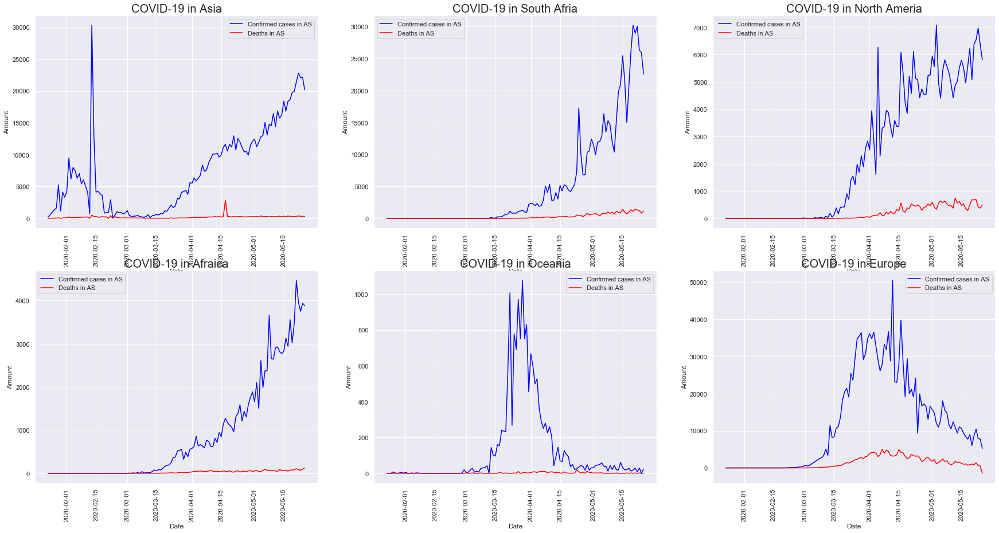

In [417]:
plt.figure(figsize=(30,15))
for i in range(len(continents_names)):
    plt.subplot(2,3,i+1)
    sns.lineplot(AS_c.Date, confirm_continent[i].TargetValue,label='Confirmed cases in AS',color='Blue')
    sns.lineplot(AS_f.Date, fatality_continent[i].TargetValue,label='Deaths in AS',color='Red')
    plt.title('COVID-19 in {}'.format(continents_names[i]),fontsize=20)
    plt.ylabel('Amount')
    plt.xlabel('Date')
    plt.xticks(rotation=90)
    plt.legend()
    

# COVID-19 in The USA 

In [420]:
# import packages
import plotly.figure_factory as ff
# read the data whitch contains fips 
df_confirm=pd.read_csv('/Users/yingyuxuan/Desktop/covid19-global-forecasting-week-5/data/df_confirm.csv')
df_fatality=pd.read_csv('/Users/yingyuxuan/Desktop/covid19-global-forecasting-week-5/data/df_fatality.csv')

In [421]:
 df_confirm['County Name/State Abbreviation'][0].split(',')

['Abbeville', ' SC']

In [422]:
# code:https://plotly.com/python/county-choropleth/
def USA_map(df,endpts,title):
    # plot 
    colorscale = ["#f7fbff","#deebf7","#c6dbef","#9ecae1","#6baed6","#2171b5","#08306b"]
    fips = df['FIPS_y'].tolist()
    values = df['TargetValue'].tolist()

    fig = ff.create_choropleth(
        fips=fips, values=values,
        binning_endpoints=endpts,
        colorscale=colorscale,
        show_state_data=False,
        show_hover=True, centroid_marker={'opacity': 0},
        asp=2.9, title='COVID-19 {} from Jan-May 2020 in USA'.format(title),
        legend_title='Confirom Cases'
    )

    fig.layout.template = None
    fig.show()

In [426]:
# USA map for confirmed cases 
endpts =[0,10,50,500,2000,200000]
USA_map(df_confirm,endpts,"Confirmed Cases")

 <img src= 'images/confirmedcases_usa_map.png'/>

In [90]:
# USA map for fatalities 
endpts =[0,5,15,60,550,20000]
USA_map(df_fatality,endpts,'Fatality')

 <img src= 'images/fatality_usa_map.png'/>

# USA overall trands of confirmed cases and fatalities

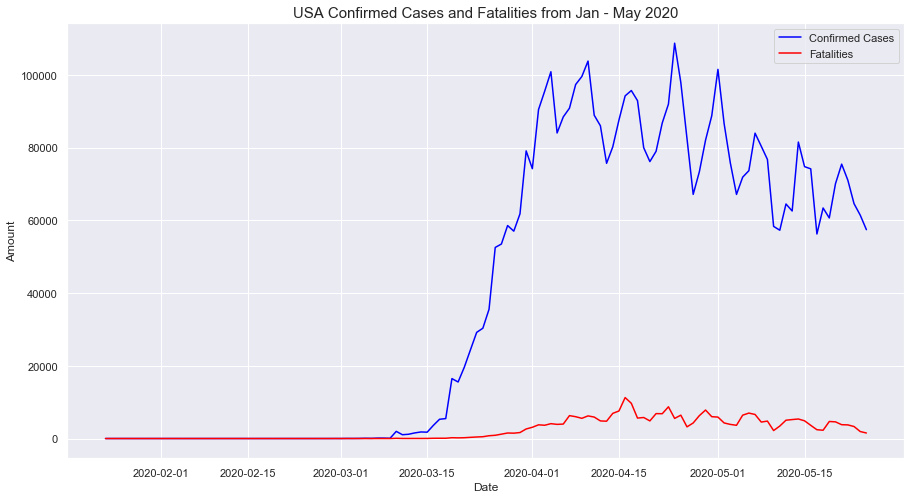

In [29]:
# Separate and obtian confirmed cases and fatalities data 
us_confirm=df[df.Country_Region=="US"][df[df.Country_Region=="US"].Target=='ConfirmedCases']
us_death=df[df.Country_Region=="US"][df[df.Country_Region=="US"].Target=='Fatalities']

# groupby by date
usa_overall_con=pd.DataFrame(us_confirm.groupby('Date')['TargetValue'].sum()).reset_index()
usa_overall_fa=pd.DataFrame(us_death.groupby('Date')['TargetValue'].sum()).reset_index()

plt.figure(figsize=(15,8))
sns.lineplot(usa_overall_con.Date,usa_overall_con.TargetValue,label='Confirmed Cases',color='blue')
sns.lineplot(usa_overall_fa.Date,usa_overall_fa.TargetValue,label='Fatalities',color='red')
plt.legend()
plt.ylabel('Amount')
plt.title('USA Confirmed Cases and Fatalities from Jan - May 2020',fontsize=15)
plt.show()

# Individual states 

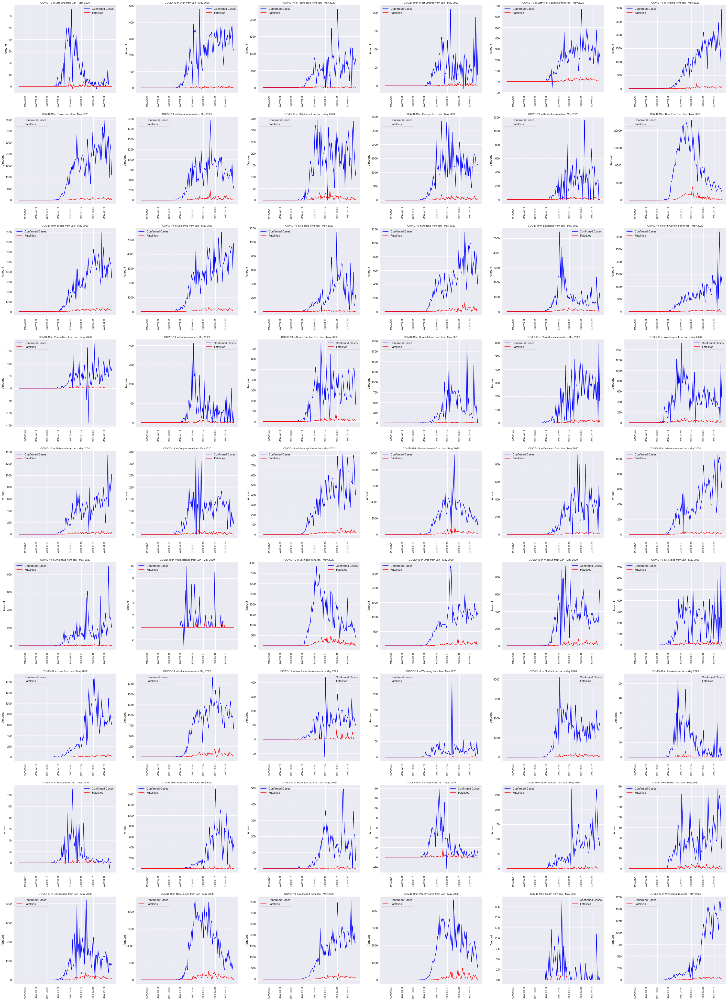

In [92]:
# trends By the states
State=list(set(df[df.Country_Region=="US"].Province_State))[1:]
plt.figure(figsize=(40,60))
for i in range(len(State)):
    plt.subplot(10,6,i+1)
    c=us_confirm[us_confirm.Province_State==State[i]].groupby('Date')['TargetValue'].sum().reset_index()
    f=us_death[us_death.Province_State==State[i]].groupby('Date')['TargetValue'].sum().reset_index()
    plt.plot(c.Date,c.TargetValue,label='Confirmed Cases',color='blue')
    plt.plot(f.Date,f.TargetValue,label='Fatalities',color='red')
    plt.legend(loc='best')
    plt.title('COVID-19 in {} from Jan - May 2020'.format(State[i]),size=10)
    plt.xticks(rotation=90,size=9)
    plt.tight_layout(pad=2.0)
    plt.ylabel('Amount')

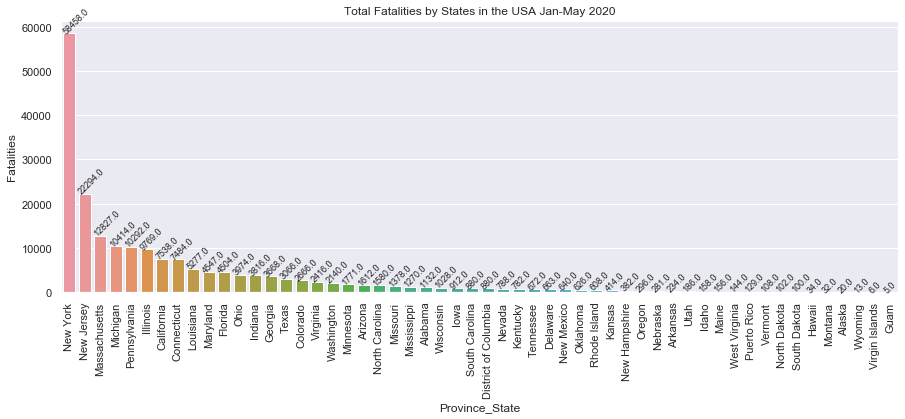

In [93]:
# total fatalities in different states 
total_fatality=pd.DataFrame(us_death.groupby('Province_State')['TargetValue'].sum()).sort_values(by='TargetValue',ascending=False)

plt.figure(figsize=(15,5))
sns.barplot(total_fatality.index,total_fatality.TargetValue)
plt.ylabel('Fatalities')
plt.xticks(rotation=90)
plt.title('Total Fatalities by States in the USA Jan-May 2020')
for i in range(len(total_fatality.index)):
    plt.text(i-0.5,total_fatality.TargetValue[i]+1,"{}".format(total_fatality.TargetValue[i]),size=9,rotation=45)
plt.show()

# Top 10 Countries by confirmed cases and fatalities

In [94]:
# top 10 countries by confirmed cases
top10_country=['US', 'Brazil', 'Russia', 'United Kingdom', 'Italy', 'France', 'Germany', 'Canada', 'China', 'Turkey']

In [95]:
country_f=df_f[df_f.Country_Region==top10_country[0]]
sum(country_f.TargetValue)

293387.0

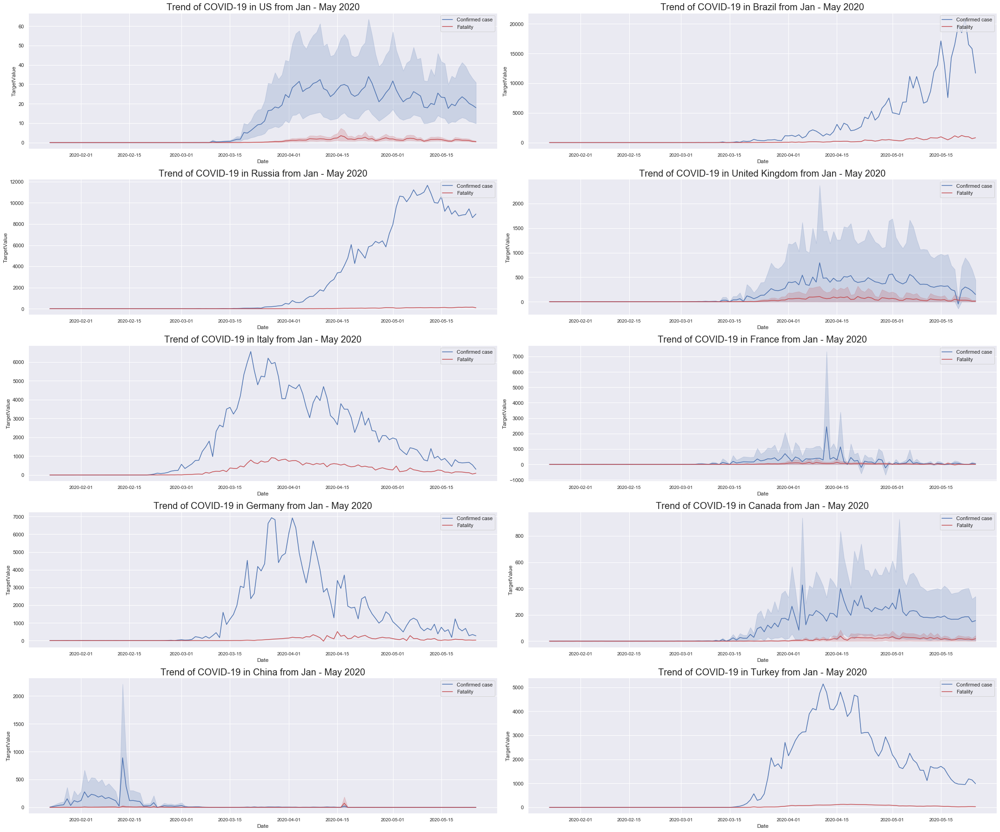

In [96]:
plt.figure(figsize=(30,25))
for i in range(len(top10_country)):
    plt.subplot(5,2,i+1)
    # create dataframes for confirmed cases and fatalities  
    country_c=df_c[df_c.Country_Region==top10_country[i]]
    country_f=df_f[df_f.Country_Region==top10_country[i]]
    # plot using seaborn
    sns.lineplot(country_c.Date,country_c.TargetValue,color='b',label='Confirmed case')
    sns.lineplot(country_f.Date,country_f.TargetValue,color='r',label='Fatality')
    plt.xticks(size=10) 
    plt.legend(loc=1)
    plt.tight_layout(pad=1.0)
    plt.title("Trend of COVID-19 in {} from Jan - May 2020".format(top10_country[i]),fontsize=20)